# Discrete-time Quantum Walk Algorithm
Created by Fernando Torres Leal

Quantum walks are known to be the analogs of classical random walks or Markov chains. They are motivated by the intrinsic randomness of quantum processes. They can be described as evolving continuously in time or by a discrete sequence of steps[[1](#discrete_vs_cont)]. The use of quantum walks for quantum algorithms has been increasing, showing impressive benefits such as exponential and even polynomial speedup of classical algorithms for specific problems [[1](#discrete_vs_cont),[2](#exp_speedup)].

In this notebook we will look into the implementation of the discrete-time Quantum Walk Algorithm for a specific graph $G = (V,E)$ where $V$ is a set of vertices and $E$ a set of edges. At each step of the quantum walk there is equal probability of moving to a neihboring vertex. This process can be understood through the matrix [[3](#echilds_notes)],
$$
\begin{equation}
M_{ik} =
\begin{cases}
1/\text{deg}(k) & (i,k)\in V\\
0 & \text{otherwise},
\end{cases}
\end{equation}
$$
where $\text{deg}(\cdot)$ is the degree of the vertex (the number of edges connected to the vertex). The probability of $p$ evolves as $p' = Mp$. To tranlsate this into a quantum process we can first encode each vertex in a state $|i\rangle$ and define an operator $U_{i}$ expresses it as as superposition of its neighbors $|k\rangle$ [[3](#childs_notes)],

$$
\begin{equation}
U_{i}|i\rangle = |\partial_{i}\rangle = \frac{1}{\text{deg}(i)}\sum_{k:(i,k)\in V} |k\rangle,
\end{equation}
$$
where an implementation for operator $U_{i}$ is going to be explained in the Guided Implementatio. In order to account for possible common neighbors, states of the form $|i,k\rangle$ are proposed such that a walker in vertex $i$ is going to travel to vertex $k$ in the next step. To represent the evolution, a 'coin flip' operator is needed in the form of a difussion operator [[3](#childs_notes)], 
$$
\begin{equation}
C = \sum_{i\in V} |i\rangle \langle i | \otimes (2|\partial_{i}\rangle \langle \partial_{i}| - I) .
\end{equation}
$$
After the walker has traveled into another vertices a swap opertion must be performed to adjust the state [[3](#childs_notes)], 
$$
\begin{equation}
S = \sum_{(i,k)\in V} |i,k\rangle \langle k,i |.
\end{equation}
$$

Each step of the quantum walk is given by applying $SC$ and with this the mathematical model is described. Detailed mathematical description is found in [[3](#childs_notes)].

# Guided Implementtion

To implement the aforementioned algorithm using Classiq, we are going to use as an example the following line graph of 16 vertices.

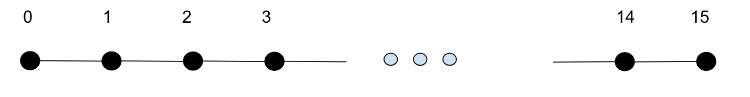




This graph is composed by the set of vertices
$$V = \{0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15\},$$
and by the set of edges
$$E = \{(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,7),(7,8),(8,9),(9,10),(10,11),(11,12),(12,13),(13,14),(14,15) \}.$$

## Encoding

We are going to assign to the encoded vertex $|i\rangle$ to the qubits `vertices : QNum` which will account for all the vertices on the set $V$, and for the adjacent vertices $|k\rangle$ the qubits `adjacent_vertices : QNum` which will account for the vertices adjacent to vertex $i$.The required number of qubits for each group is $\text{log}_2(|V|)$. So for example, for a graph with 16 vertices, we need $\text{log}_2(16) = 4$ qubits for the vertices and another 4 qubits for the adjacent vertices which will be allocated using the function `allocate`.

The `hadamard_transfrom` is used to start the superposition and use the quantum advantages it provides.

In [1]:
from classiq import *

size = 4

@qfunc 
def main(vertices:Output[QNum], adjacent_vertices:Output[QNum]):

  allocate(size,vertices)
  hadamard_transform(vertices)
  allocate(size,adjacent_vertices)

## Evolution

The evolution of the quantum walk as already explained is divided in a 'Coin Operator' and a Swap operator. In order to implement them with Classiq we the following functions will be of great importance:

* [Within-Apply](https://docs.classiq.io/latest/reference-manual/platform/qmod/language-reference/statements/within-apply/): The Within-Apply maps unitary operations of the kind $V = U^{-1} W U$ into the quantum circuit, given $U$ and $W$. 
* [Control](https://docs.classiq.io/latest/reference-manual/platform/qmod/language-reference/statements/control/): The control statement applies a unitary operation conditionally, depending on a quantum state.
* [Repeat](https://docs.classiq.io/latest/explore/tutorials/classiq_concepts/repeat/repeat/): The repeat concept of the QMOD language is just like a classical for loop but for quantum objects
* [Inplace_state_preparation](https://docs.classiq.io/latest/explore/functions/qmod_library_reference/qmod_core_library/prepare_state_and_amplitudes/prepare_state_and_amplitudes/): creates a quantum state with given probabilities in the computational basis.

### Coin Operator

As stated, the coin operator corresponds to the operator $C$ and for implementing this first let's rewrite it as,
$$
\begin{equation}
C = \sum_{i\in V} |i\rangle \langle i | \otimes U_{i}(2|0\rangle \langle 0| - I)U_{i}^{\dagger},
\end{equation}
$$
where the operator $U_{i}$ generates an equal superposition of the adjacent vertices to a vertex $i$, and it's implementation will be explained after. We know that this operator is a difussion operator and $(2|0\rangle \langle 0| - I)$ resembles to the oracle from Grover's Algortihm. So this must correspond to the following action over a state $|i\rangle$,
$$
\begin{equation}
(2|0\rangle \langle 0| - I)|j\rangle = (-1)^{j\neq0}|j\rangle,
\end{equation}
$$

This can be checked by applying the operator to different states,
$$
\begin{align}
(2|0\rangle \langle 0| - I)|0\rangle &= |0\rangle,\\
(2|0\rangle \langle 0| - I)|1\rangle &= -|1\rangle,\\
(2|0\rangle \langle 0| - I)|2\rangle &= -|2\rangle,\\
&\vdots\\
(2|0\rangle \langle 0| - I)|j\neq 0 \rangle &= -|j\neq0\rangle,
\end{align}
$$
and we see a Phase Kick Back (PKB) effect for states different that the vertex 0. We can implement this oracle using the functions `prepare_minus` that is a standard procedure for preparing a $|-\rangle$ state. 

In [2]:
from classiq import *

@qfunc
def prepare_minus(x: QBit):
  X(x)
  H(x)

And then, with the function `diffuzer_oracle`we can implement the oracle mentioned as follows,

In [3]:
from classiq import *

@qfunc
def diffuzer_oracle(aux: Output[QNum],x:QNum):
  aux^=(x!=0)

Then, the whole oracle will be implemented by allocating an ancilla qubit for the PKB as,

In [4]:
from classiq import *

@qfunc
def zero_diffuzer(x: QNum):
  aux = QNum('aux')
  allocate(1,aux)
  within_apply(compute=lambda: prepare_minus(aux),
              action=lambda: diffuzer_oracle)

Now, in order to explain the operator $U_{i}$ it needs to be streesed that this operator will have to be defined depending on the graph but the functioning in general will be discussed.

Since we know that $U_{i}$ has the effect of initializing a superposition of the adjacent vertices of a vertex $i$, then we can make use of the function `inplace_prepare_state` and the worry of how to build the probability vector. For this example, only at the ends will we have a single neighbor, and at every other vertex, the only adjacent vertices are the ones to the left and to the right. The code for this can be synthesized as follows:

In [5]:
for i in range(2**size):

    prob = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    
    if i == 0:
        prob[i+1] = 1
    elif i == 15:
        prob[i-1] = 1
    else:
        prob[i+1] = 0.5
        prob[i-1] = 0.5
    
    print(f'State={i}, prob vec ={prob}')

State=0, prob vec =[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=1, prob vec =[0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=2, prob vec =[0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=3, prob vec =[0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=4, prob vec =[0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=5, prob vec =[0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=6, prob vec =[0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0]
State=7, prob vec =[0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0]
State=8, prob vec =[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0]
State=9, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0]
State=10, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0]
State=11, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0]
State=12, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0]
State=13, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 

where we need to be careful with the normalization. In order to complete the $C$ operator, we need to take account for the term $|i\rangle\langle i |$ for this, we can use the `control` function in order to prepare the needed state depending on the vertex $i$ and then apply the aready built diffuser.

In [6]:
from classiq import *

def C_iteration(i:int,vertices: QNum, adjacent_vertices:QNum):
    prob = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

    if i == 0:
        prob[i+1] = 1
    elif i == 15:
        prob[i-1] = 1
    else:
        prob[i+1] = 0.5
        prob[i-1] = 0.5
    
    print(f'State={i}, prob vec ={prob}')
    
    control(ctrl=vertices==i,
            operand=lambda: within_apply(
              compute= lambda: inplace_prepare_state(probabilities=prob, bound=0.01, target=adjacent_vertices),
              action= lambda: zero_diffuzer(adjacent_vertices)))

We now just need to iterate on every existant vertex and the $C$ operator will be containg on the function `C_operator`

In [7]:
from classiq import *

@qfunc 
def C_operator(vertices:QNum, adjacent_vertices: QNum):
    for i in range(2**size):
      C_iteration(i,vertices,adjacent_vertices)

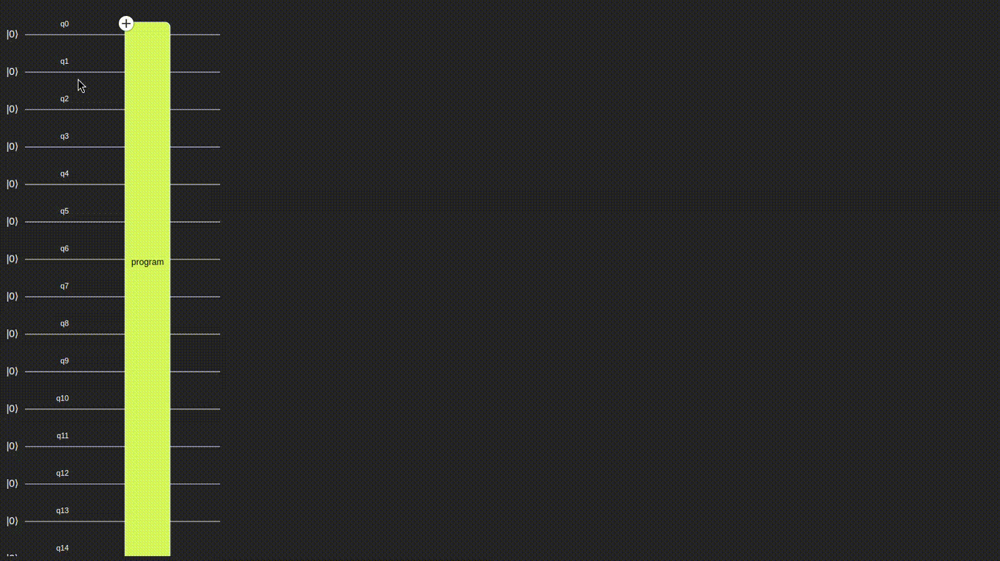

### Swap operator

Now, for the Swap operator, we can make use of the already implemented `SWAP` operator and adjust it to iterate on every vertex with the function `bitwise_swap`.

In [8]:
from classiq import *

@qfunc 
def bitwise_swap(x: QArray[QBit], y:QArray[QBit]):
  repeat(count= x.len,
    iteration= lambda i: SWAP(x[i],y[i]))

Now we need to define an oracle to distinguish if two vertices are neighbors or not. This is graph dependent, but a nice trick is to substract the vertices from the adjacent_vertices, since all the vertices are ordered the only way that two are adjacent is that the difference between them is either 1 or -1 we can define the `oracle_edge` as,

In [9]:
from classiq import *

@qfunc
def edge_oracle(res:Output[QBit], vertices: QNum, adjacent_vertices: QNum):
  res |= ( ((vertices-adjacent_vertices)== 1) | ((vertices-adjacent_vertices) == -1) )

To complete the Swap operator we need just to apply the swap only in the cases where the vertices are adjacent to one another using the just defined function.

In [10]:
from classiq import *

@qfunc 
def S_operator(vertices:QNum, adjacent_vertices: QNum):
    res = QNum('res')
    edge_oracle(res,vertices,adjacent_vertices)
    control(ctrl= res==1,
        operand= lambda: bitwise_swap(vertices,adjacent_vertices))

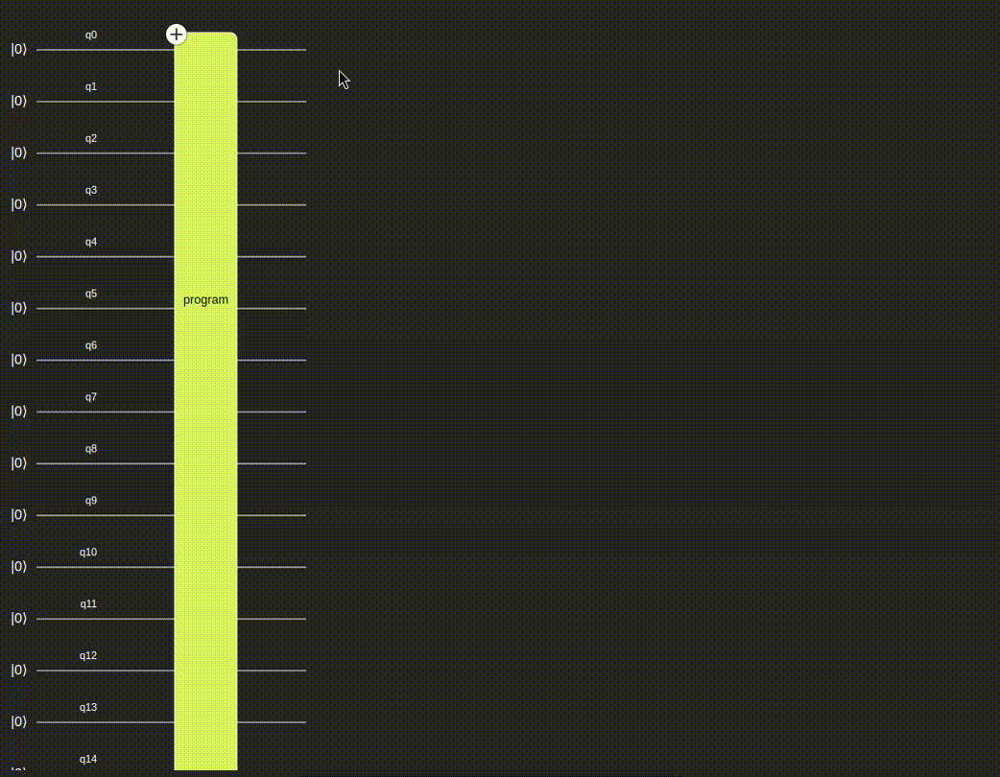

# The complete code

You can see the complete Python version of this code below:

In [11]:
from classiq import *

size = 4

@qfunc
def prepare_minus(x: QBit):
  X(x)
  H(x)


@qfunc
def diffuzer_oracle(aux: Output[QNum],x:QNum):
  aux^=(x!=0)


@qfunc
def zero_diffuzer(x: QNum):
  aux = QNum('aux')
  allocate(1,aux)
  within_apply(compute=lambda: prepare_minus(aux),
              action=lambda: diffuzer_oracle)


def C_iteration(i:int,vertices: QNum, adjacent_vertices:QNum):
    prob = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

    if i == 0:
        prob[i+1] = 1
    elif i == 15:
        prob[i-1] = 1
    else:
        prob[i+1] = 0.5
        prob[i-1] = 0.5
    
    print(f'State={i}, prob vec ={prob}')
    
    control(ctrl=vertices==i,
            operand=lambda: within_apply(
              compute= lambda: inplace_prepare_state(probabilities=prob, bound=0.01, target=adjacent_vertices),
              action= lambda: zero_diffuzer(adjacent_vertices)))

@qfunc 
def C_operator(vertices:QNum, adjacent_vertices: QNum):
    for i in range(2**size):
      C_iteration(i,vertices,adjacent_vertices)


@qfunc
def edge_oracle(res:Output[QBit], vertices: QNum, adjacent_vertices: QNum):
  res |= (((vertices+adjacent_vertices)%2) ==1)


@qfunc 
def bitwise_swap(x: QArray[QBit], y:QArray[QBit]):
  repeat(count= x.len,
    iteration= lambda i: SWAP(x[i],y[i]))
  

@qfunc 
def S_operator(vertices:QNum, adjacent_vertices: QNum):
    res = QNum('res')
    edge_oracle(res,vertices,adjacent_vertices)
    control(ctrl= res==1,
        operand= lambda: bitwise_swap(vertices,adjacent_vertices))

@qfunc 
def main(vertices:Output[QNum], adjacent_vertices:Output[QNum]):

  allocate(size,vertices)
  hadamard_transform(vertices)
  allocate(size,adjacent_vertices)

  C_operator(vertices,adjacent_vertices)
  S_operator(vertices,adjacent_vertices)

qmod = create_model(main)
qprog = synthesize(qmod)

State=0, prob vec =[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=1, prob vec =[0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=2, prob vec =[0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=3, prob vec =[0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=4, prob vec =[0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=5, prob vec =[0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0]
State=6, prob vec =[0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0]
State=7, prob vec =[0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0]
State=8, prob vec =[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0, 0]
State=9, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0, 0]
State=10, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0, 0]
State=11, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0, 0]
State=12, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 0, 0]
State=13, prob vec =[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 

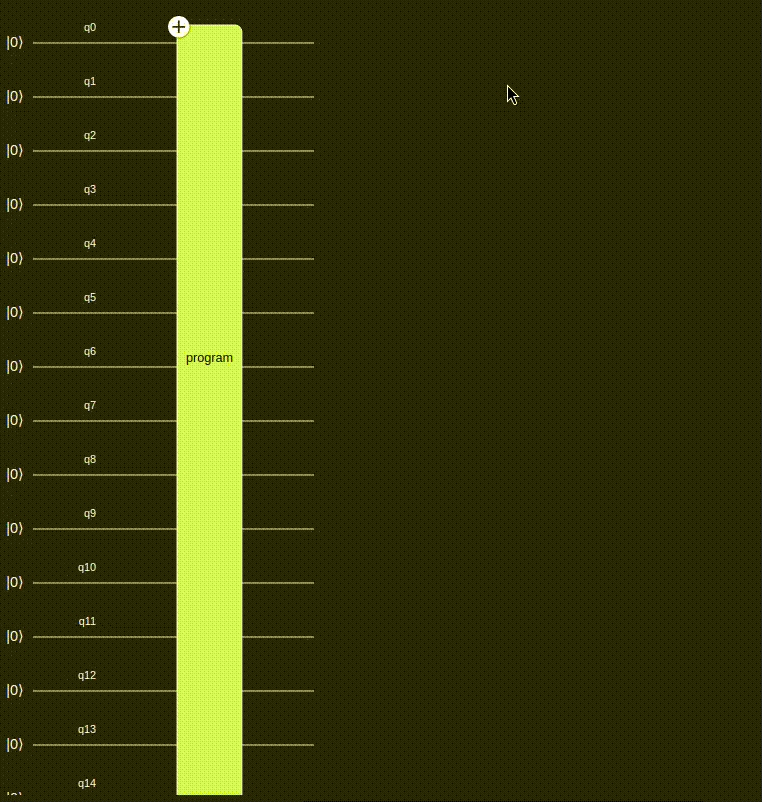

# References
<a id='discrete_vs_cont'>[1]</a>: [On the relationship between continuousand discrete-time quantum walk (Andrew M. Childs)](https://arxiv.org/pdf/0810.0312)

<a id='exp_speedup'>[2]</a>: [Exponential algorithmic speedup by quantum walk (Andrew M. Childs, Richard Cleve, Enrico Deotto, Edward Farhi, Sam Gutmann, and Daniel A. Spielman)](https://arxiv.org/pdf/quant-ph/0209131)

<a id='childs_notes'>[3]</a>: [Lecture Notes on
Quantum Algorithms (Andrew M. Childs)](https://www.cs.umd.edu/~amchilds/qa/qa.pdf)

In [12]:
write_qmod(qmod, "discrete_time_quantum_walk_on_a_line")